Begun 8/3/2024

The goal here is to test a few methods for filling in small holes within the depth-1 maps so that we don't apodize around them and end up with maps that look like swiss cheese. We want to apodize around the major edges, but it is just a few pixels in the middle of an otherwise nice area, we can fill them in with the minimum of the inverse variance map.

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from pixell import enmap, enplot, reproject, utils, curvedsky
from tqdm import tqdm
import nawrapper as nw
import yaml
import time
import healpy as hp
import scipy

In [5]:
keys_eshow = {"downgrade": 2, "ticks": 5, "colorbar": True, "font_size": 40}

def eshow(x,**kwargs): 
    ''' Function to plot the maps for debugging '''
    plots = enplot.get_plots(x, **kwargs)
    enplot.show(plots, method = "auto")

def make_tapered_mask(map_to_mask,filter_radius=1.0,plot=False):
    """
        Makes a mask for a given map based on where the ivar map is nonzero.
        Also apodizes the mask and gets the indices of where the apodized
        mask is not equal to one (everything tapered or outside the mask)
        in order to set all points but those to zero after filtering.
    """
    footprint = 1*map_to_mask.astype(bool)
    mask = nw.apod_C2(footprint,filter_radius)
    
    # Getting points to set to zero after filtering
    indices = np.nonzero(mask != 1)
    
    if plot:
        eshow(mask, **keys_eshow)
    
    return mask, indices

In [3]:
obs_list = "/home/zbh5/act_analysis/dr6_analysis/dr6_depth1_maps/dr6_depth1_test_map_list.txt"
with open(obs_list) as f:
    lines = f.read().splitlines()

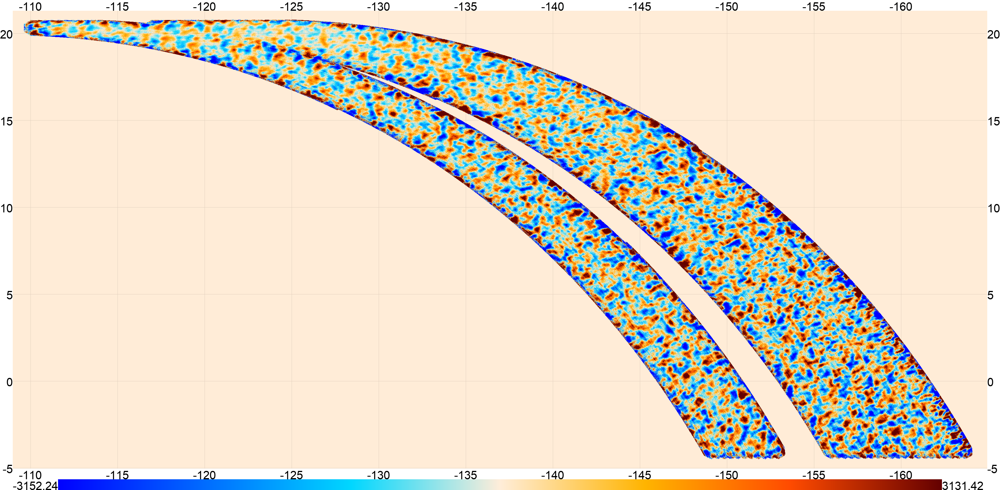

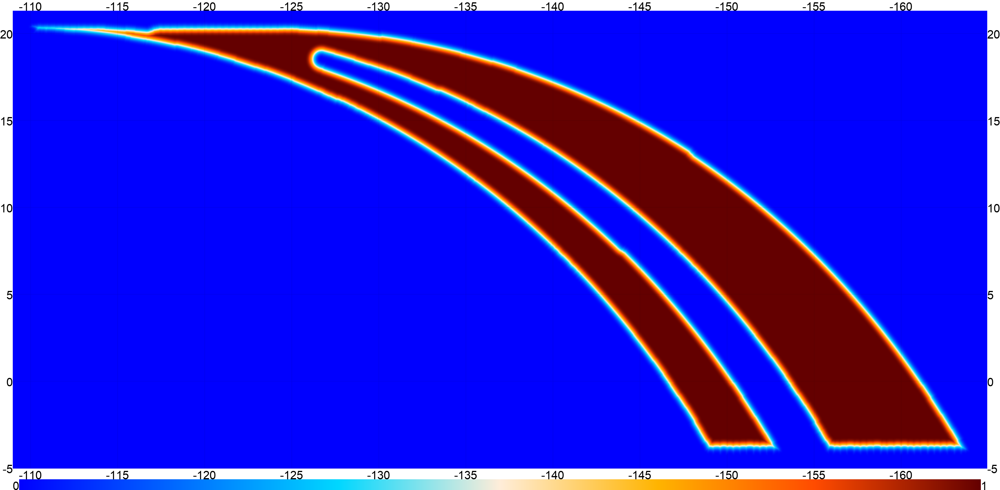

In [37]:
depth1_path = '/home/zbh5/act_analysis/dr6_analysis/dr6_depth1_maps/' + lines[10]
depth1_T = enmap.read_map(depth1_path)[0]
eshow(depth1_T, **keys_eshow)
ivar_path = depth1_path[:-8] + "ivar.fits"
depth1_ivar = 1.0*enmap.read_map(ivar_path) # 1.0 for T noise - shouldn't matter here; we just want the ivar shape
depth1_mask, depth1_indices = make_tapered_mask(depth1_ivar,filter_radius=1.0,plot=True)

Map 0 is a good examle of one with a handful of missing pixels. Map 10 is a decent example of one where a missing scan causes a lot of other data to be cut out - we might be able to do something about this too, even if it is more than a handful of isolated pixels.

In [21]:
# Steve's function for apodizing over apo_zero pixels into the zeros of a binary mask
def apodize_edge(m,apo_over):
    dist = scipy.ndimage.distance_transform_edt(m)
    dist[dist>apo_over] = np.min(dist[dist>apo_over])
    # make linear apodization into sin
    dist_max = np.max(dist)
    keep = np.where((dist>0.)&(dist<dist_max))
    edge = dist[keep]
    edge = dist_max - ((dist_max-edge)/dist_max-1./(2*np.pi)*np.sin(2*np.pi*(dist_max-edge)/dist_max))
    dist[keep] = edge
    dist[dist>0] -= np.min(edge)
    dist /= np.max(dist)
    return m*dist

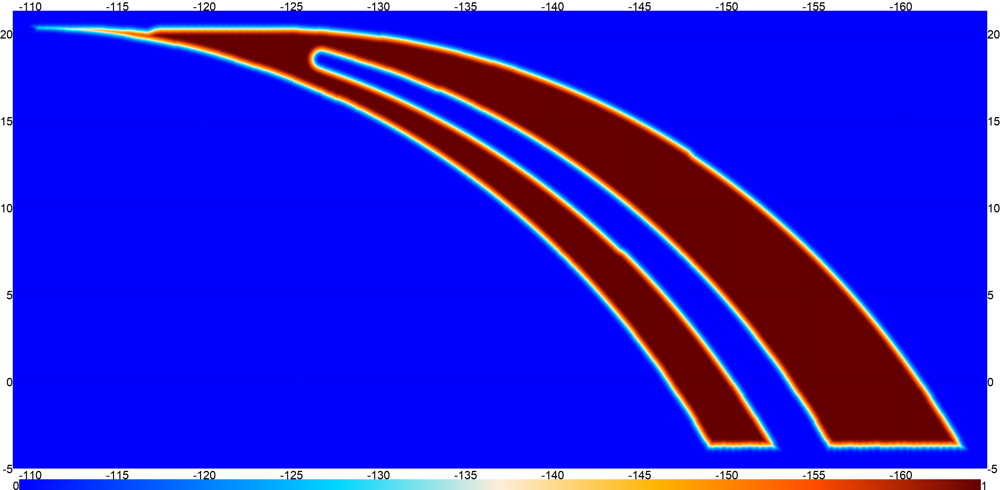

In [27]:
# Testing with apo_over=0 - should be similar to my current depth1_mask, though the apodization function
# is different
# It runs into an error with apo_over=0.
# apo_over=120 seems pretty similar to the amount of apodization we get from a filter radius of 1.0 deg
footprint = 1*depth1_ivar.astype(bool)
test_mask = apodize_edge(footprint,120)
eshow(test_mask, **keys_eshow)

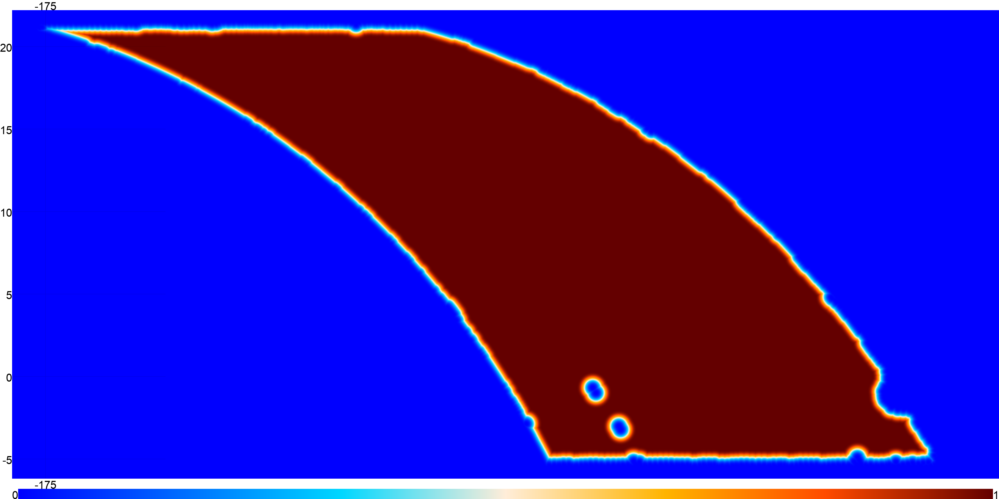

In [72]:
depth1_path = '/home/zbh5/act_analysis/dr6_analysis/dr6_depth1_maps/' + lines[0]
depth1_T = enmap.read_map(depth1_path)[0]
#eshow(depth1_T, **keys_eshow)
ivar_path = depth1_path[:-8] + "ivar.fits"
depth1_ivar = 1.0*enmap.read_map(ivar_path) # 1.0 for T noise - shouldn't matter here; we just want the ivar shape
depth1_mask, depth1_indices = make_tapered_mask(depth1_ivar,filter_radius=1.0,plot=True)

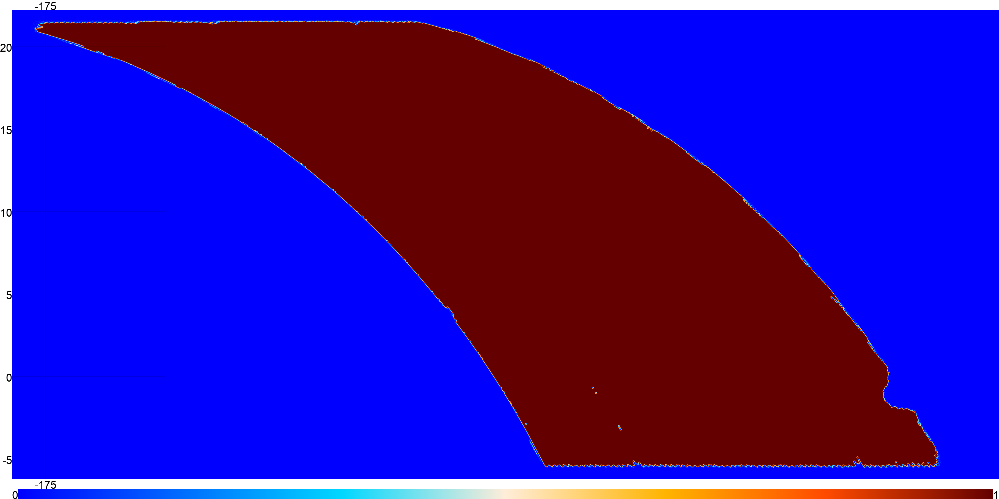

In [33]:
footprint = 1*depth1_ivar.astype(bool)
test_mask = apodize_edge(footprint,10)
eshow(test_mask, **keys_eshow)

<class 'numpy.ndarray'>
<class 'pixell.enmap.ndmap'>


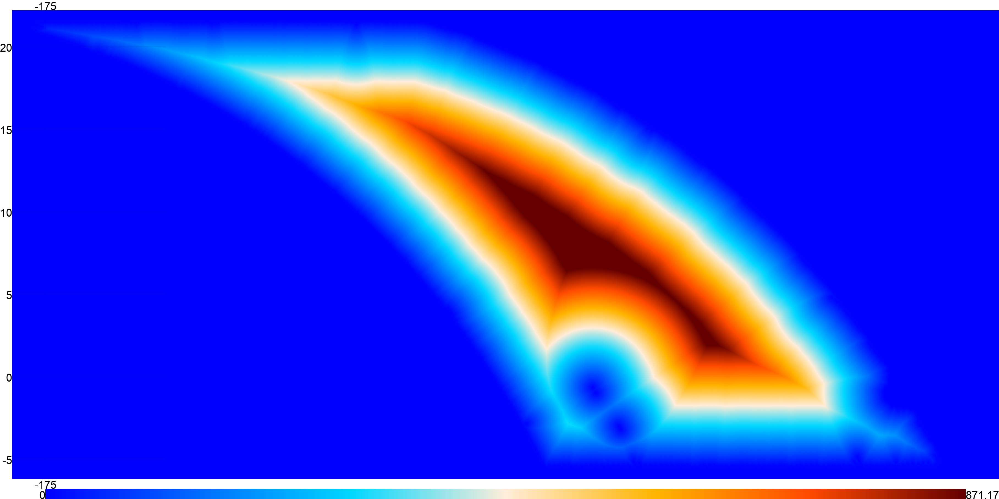

In [64]:
dist_map = scipy.ndimage.distance_transform_edt(footprint)
print(type(dist_map))
# Need to make it back into a pixell map and then show it
dist_map = enmap.samewcs(dist_map,footprint)
print(type(dist_map))
eshow(dist_map, **keys_eshow)

(3408, 7178)
(3408, 7178)


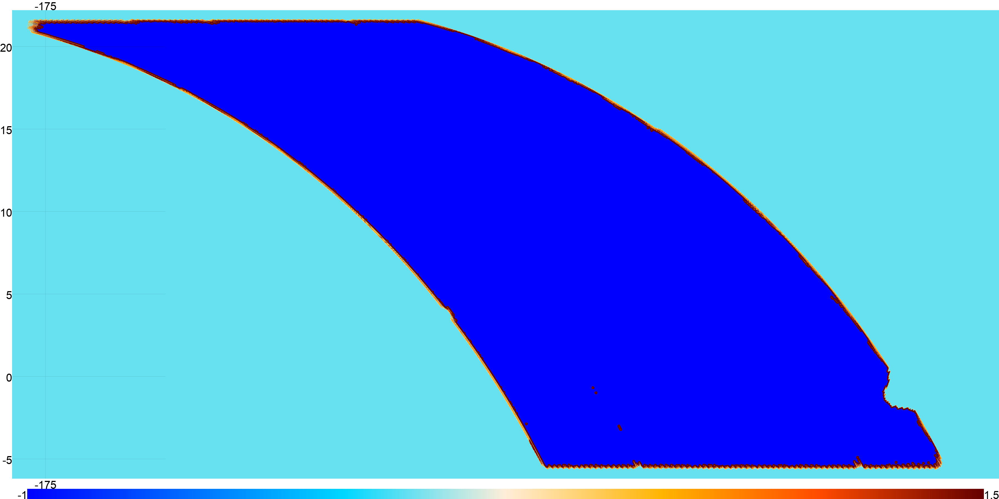

In [70]:
indices = dist_map > 10
masked_dist_map = np.copy(dist_map)
masked_dist_map[indices] = -1
masked_dist_map = enmap.samewcs(masked_dist_map,footprint)
print(masked_dist_map.shape)
print(dist_map.shape)
eshow(masked_dist_map, **keys_eshow)

(3408, 7178)
(3408, 7178)


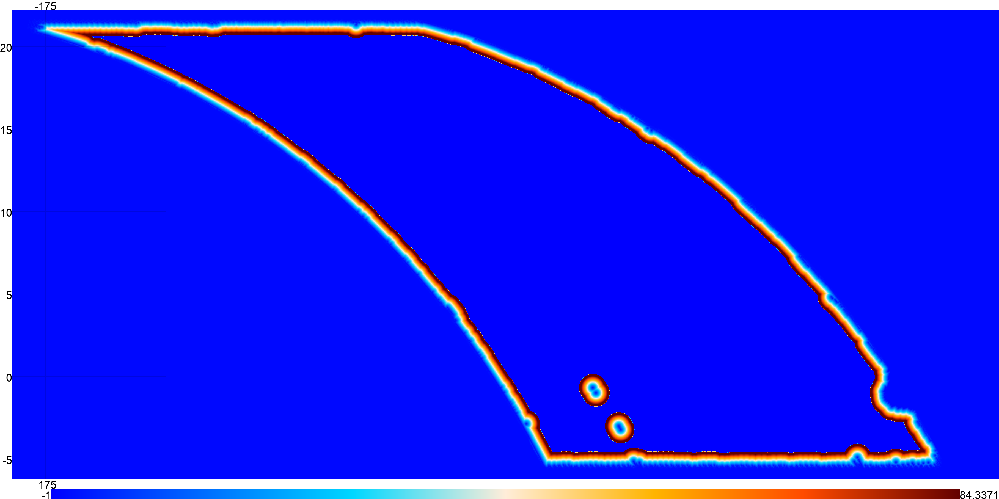

In [62]:
indices = dist_map > 100
masked_dist_map = np.copy(dist_map)
masked_dist_map[indices] = -1
masked_dist_map = enmap.samewcs(masked_dist_map,footprint)
print(masked_dist_map.shape)
print(dist_map.shape)
eshow(masked_dist_map, **keys_eshow)

(3408, 7178)
(3408, 7178)


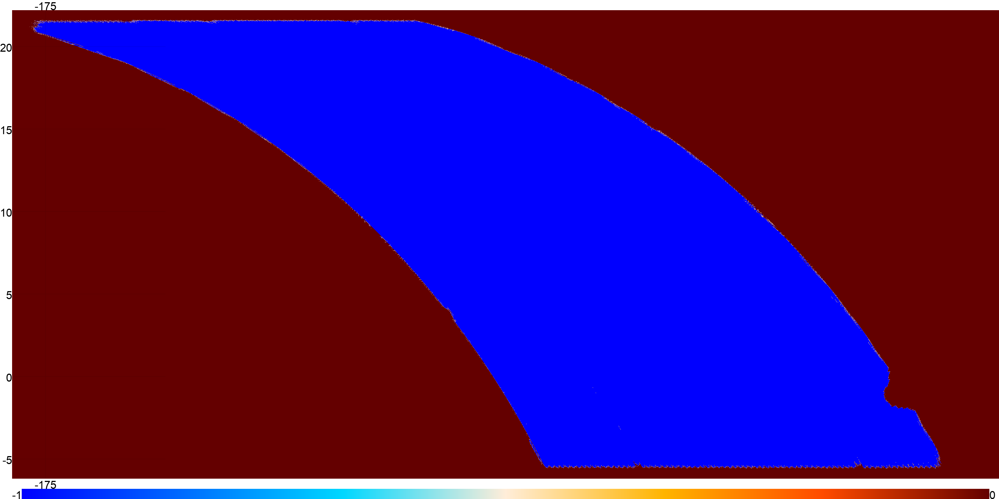

In [69]:
indices = dist_map > 1
masked_dist_map = np.copy(dist_map)
masked_dist_map[indices] = -1
masked_dist_map = enmap.samewcs(masked_dist_map,footprint)
print(masked_dist_map.shape)
print(dist_map.shape)
eshow(masked_dist_map, **keys_eshow)

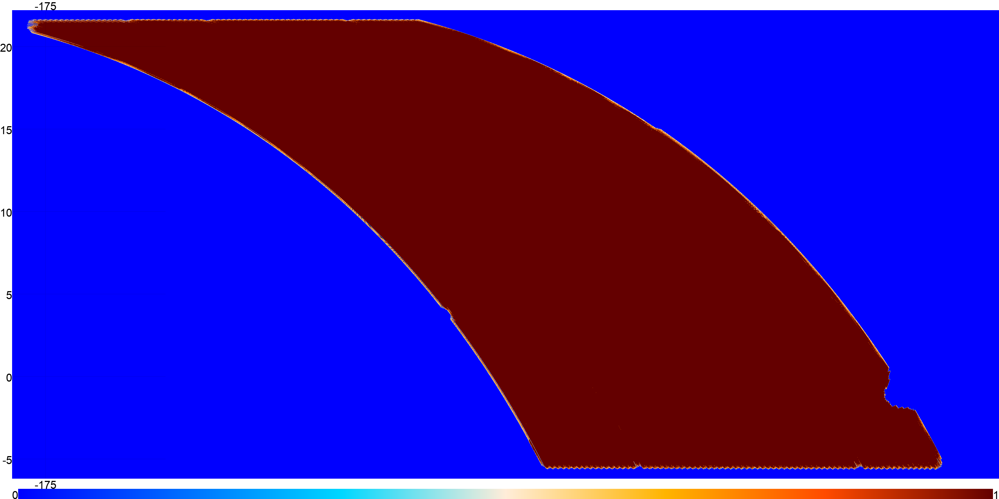

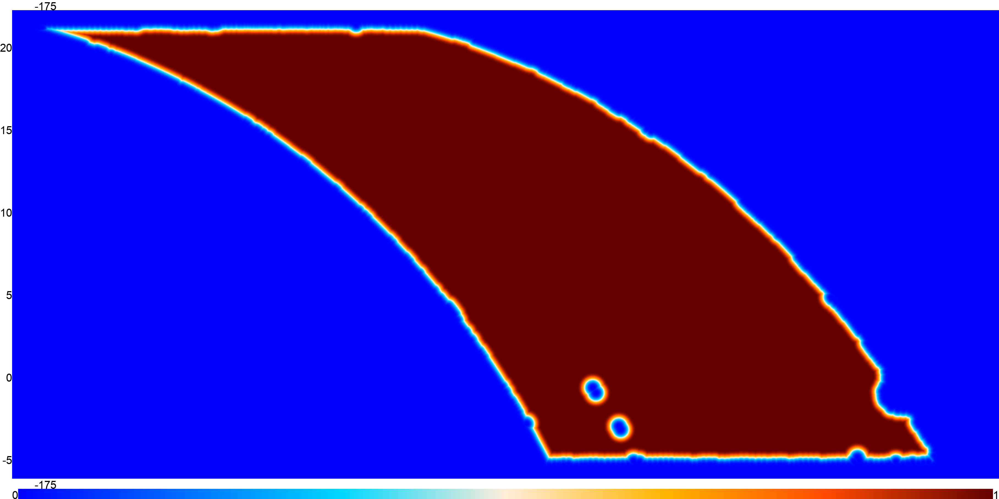

In [80]:
# Trying scipy.ndimage.binary_fill_holes
binary_mask = 1*depth1_ivar.astype(bool)
eshow(binary_mask, **keys_eshow)
# Proving it has the interior holes when apodizing
apo_binary_mask = apodize_edge(binary_mask,120)
eshow(apo_binary_mask, **keys_eshow)

<class 'pixell.enmap.ndmap'>


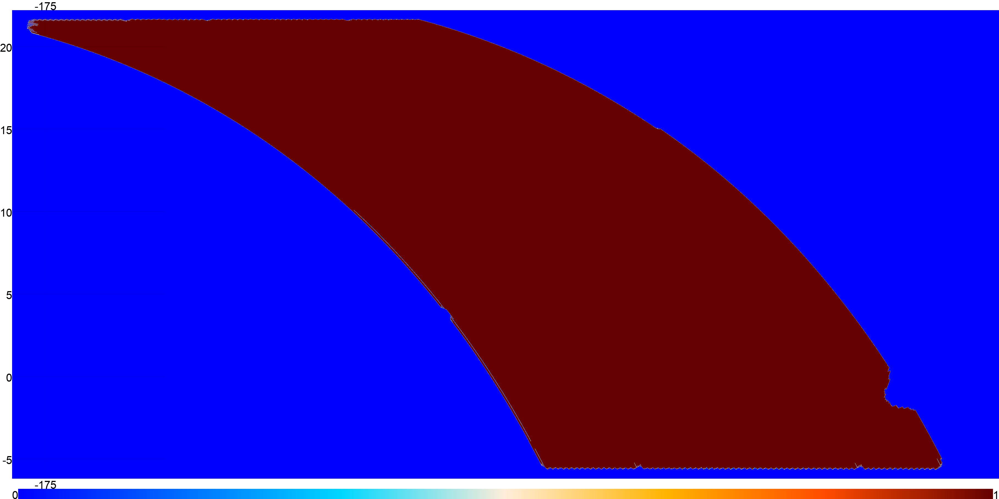

In [78]:
filled_binary_mask = scipy.ndimage.binary_fill_holes(binary_mask).astype(int)
filled_binary_mask = enmap.samewcs(filled_binary_mask,binary_mask)
print(type(filled_binary_mask))
eshow(filled_binary_mask, **keys_eshow)

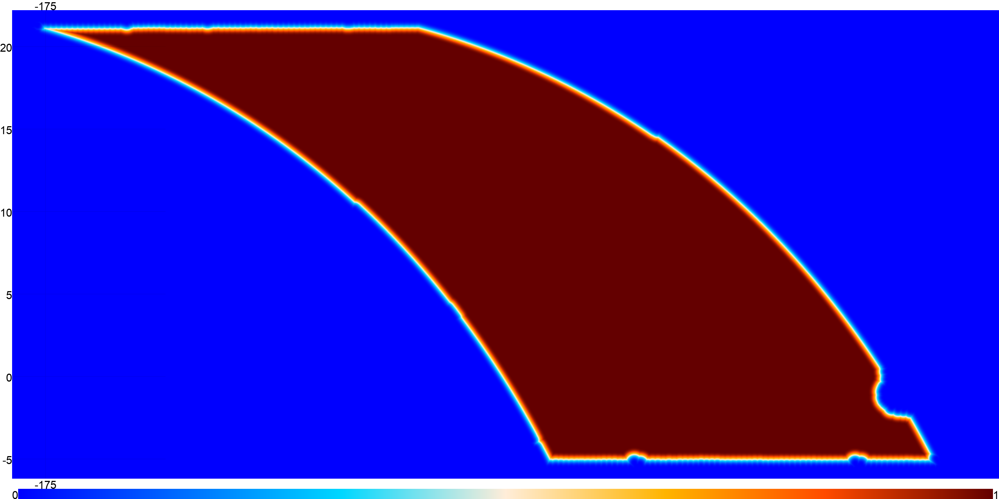

In [79]:
# Proving it no longer has the interior holes when apodizing
apo_filled_binary_mask = apodize_edge(filled_binary_mask,120)
eshow(apo_filled_binary_mask, **keys_eshow)